In [48]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf
import tf_keras
import tensorflow_hub as hub

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import warnings
warnings.filterwarnings("ignore")

In [49]:
data_dir="C:\\Users\\mvenu\\OneDrive\\Desktop\\image_classification"

In [50]:

import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification')

In [51]:
os.listdir(data_dir)

['Kane Williamson',
 'Kobe Bryant',
 'lionel_messi',
 'Maria Sharapova',
 'ms_dhoni',
 'neeraj_chopra']

In [52]:
list(data_dir.glob('*/*.jpg'))[:5]

[WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (1).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (10).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (100).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (101).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (102).jpg')]

In [53]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

608


In [54]:
kane = list(data_dir.glob('Kane Williamson/*'))
kane[:5]

[WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (1).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (10).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (100).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (101).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (102).jpg')]

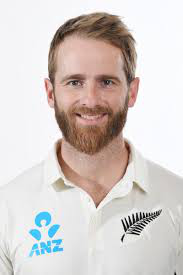

In [55]:
PIL.Image.open(str(kane[0]))

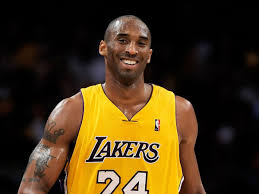

In [56]:
Kobe_Bryant = list(data_dir.glob('Kobe Bryant/*'))
PIL.Image.open(str(Kobe_Bryant[5]))

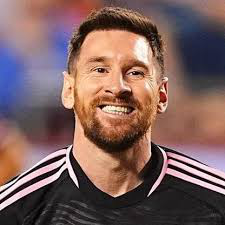

In [57]:
lionel_messi = list(data_dir.glob('lionel_messi/*'))
PIL.Image.open(str(lionel_messi[5]))

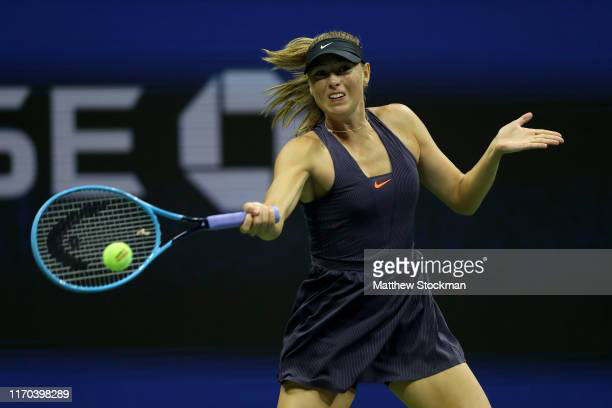

In [58]:
Maria_Sharapova = list(data_dir.glob('Maria Sharapova/*'))
PIL.Image.open(str(Maria_Sharapova[5]))

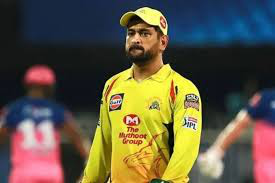

In [59]:
ms_dhoni = list(data_dir.glob('ms_dhoni/*'))
PIL.Image.open(str(ms_dhoni[5]))

In [60]:
sports_celebrity_images_dict = {
    'kane': list(data_dir.glob('Kane Williamson/*')),
    'Kobe_Bryant': list(data_dir.glob('Kobe Bryant/*')),
    'lionel_messi': list(data_dir.glob('lionel_messi/*')),
    'Maria_Sharapova': list(data_dir.glob('Maria Sharapova/*')),
    'ms_dhoni': list(data_dir.glob('ms_dhoni/*')),
    'neeraj_chopra': list(data_dir.glob('neeraj_chopra/*')),   
}

In [61]:
sports_celebrity_labels_dict = {
    'kane': 0,
    'Kobe_Bryant': 1,
    'lionel_messi': 2,
    'Maria_Sharapova': 3,
    'ms_dhoni': 4,
    'neeraj_chopra':5
}

In [62]:
sports_celebrity_images_dict['kane'][:5]

[WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (1).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (10).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (100).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (101).jpg'),
 WindowsPath('C:/Users/mvenu/OneDrive/Desktop/image_classification/Kane Williamson/images (102).jpg')]

In [63]:
str(sports_celebrity_images_dict['kane'][0])

'C:\\Users\\mvenu\\OneDrive\\Desktop\\image_classification\\Kane Williamson\\images (1).jpg'

In [64]:
img = cv2.imread(str(sports_celebrity_images_dict['kane'][0]))

In [65]:
img.shape

(275, 183, 3)

In [66]:
cv2.resize(img,(224,224)).shape

(224, 224, 3)

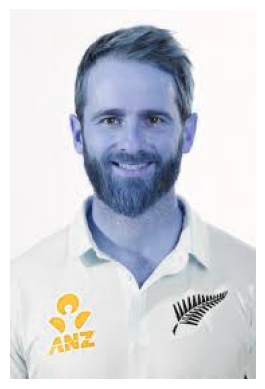

In [67]:
plt.axis('off')
plt.imshow(img)

In [68]:
X, y = [], []

for sports_celebrity_name, images in sports_celebrity_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(224,224))
        X.append(resized_img)
        y.append(sports_celebrity_labels_dict[sports_celebrity_name])

In [69]:
X = np.array(X)
y = np.array(y)

In [70]:
#Train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [71]:
#Preprocessing: scale images
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [72]:
#Build convolutional neural network and train it
num_classes = 6

model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=15)

Epoch 1/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.2697 - loss: 1.7678
Epoch 2/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - accuracy: 0.3567 - loss: 1.5557
Epoch 3/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - accuracy: 0.5292 - loss: 1.2681
Epoch 4/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - accuracy: 0.6236 - loss: 1.0098
Epoch 5/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - accuracy: 0.7697 - loss: 0.6386
Epoch 6/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - accuracy: 0.8503 - loss: 0.3954
Epoch 7/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - accuracy: 0.9055 - loss: 0.2963
Epoch 8/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - accuracy: 0.9520 - loss: 0.1851
Epoch 9/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - accuracy: 0.9244 - loss: 0.2198
Epoch 10/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - accuracy: 0.9343 - loss: 0.1792
Epoch 11/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - accuracy: 0.9764 - loss: 0.0927
Epoch 12/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step

In [73]:
model.evaluate(X_test_scaled,y_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.5440 - loss: 4.2303


[3.852158308029175, 0.5460526347160339]

In [74]:
predictions = model.predict(X_test_scaled)
predictions

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


array([[ 8.72611332e+00,  8.29958725e+00,  2.00049853e+00,
        -1.84229012e+01,  5.17216063e+00,  2.29419947e+00],
       [ 6.98209763e+00,  2.93069410e+00,  2.30359584e-02,
        -3.34192443e+00,  2.52106476e+00, -3.29598665e+00],
       [-6.18085718e+00,  5.94741201e+00,  7.31425285e+00,
        -1.47434826e+01,  8.72611237e+00,  8.49505901e+00],
       [-2.85079670e+00,  1.81297741e+01, -2.15723553e+01,
         9.15920639e+00,  5.54105902e+00, -1.15642271e+01],
       [-9.81329060e+00,  9.00509071e+00, -4.71428365e-01,
        -1.53220015e+01,  1.08498392e+01,  2.53406858e+00],
       [ 6.86892509e+00,  9.30216610e-01,  3.43271184e+00,
         3.02482486e+00, -1.96949327e+00, -1.64777911e+00],
       [ 3.48728538e+00, -2.75113821e+00, -6.47342384e-01,
         1.13123026e+01,  4.66262007e+00, -1.54661250e+00],
       [ 6.90227091e-01,  4.04759836e+00, -4.78341722e+00,
        -8.00384998e-01,  6.77700233e+00,  9.36195660e+00],
       [-8.64018536e+00,  2.46562366e+01, -1.586

In [75]:
score = tf.nn.softmax(predictions[0])

In [76]:
np.argmax(score)

0

In [77]:
y_test[0]

5

In [78]:
#Improve Test Accuracy Using Data Augmentation
data_augmentation = tf.keras.Sequential(
  [
    layers.RandomFlip("horizontal",  input_shape=(224,  224, 3)),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.3),
  
  ]
)

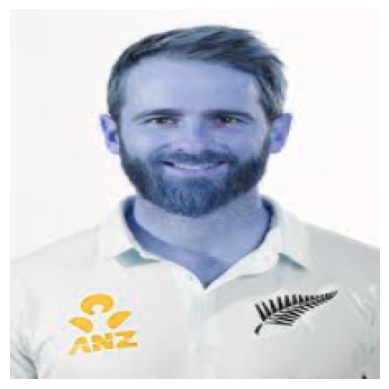

In [79]:
#Original Image
plt.axis('off')
plt.imshow(X[0])

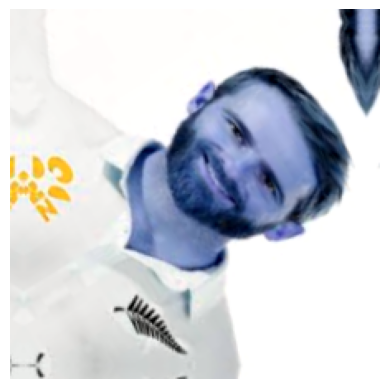

In [80]:
plt.axis('off')
plt.imshow(data_augmentation(X)[0].numpy().astype("uint8"))

In [81]:
#Train the model using data augmentation and a drop out layer

num_classes = 6

model = Sequential([
  data_augmentation,
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dense(128, activation='relu'),
  layers.Dropout(0.3),
  layers.Flatten(),
  layers.Dense(num_classes,activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=20)

Epoch 1/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - accuracy: 0.2162 - loss: 1.7525
Epoch 2/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.2876 - loss: 1.6305
Epoch 3/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - accuracy: 0.4143 - loss: 1.5834
Epoch 4/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - accuracy: 0.4554 - loss: 1.4291
Epoch 5/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 180ms/step - accuracy: 0.4906 - loss: 1.3799
Epoch 6/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step - accuracy: 0.4947 - loss: 1.4033
Epoch 7/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - accuracy: 0.5506 - loss: 1.2137
Epoch 8/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - accuracy: 0.5932 - loss: 1.2191
Epoch 9/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.5351 - loss: 1.2820
Epoch 10/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 179ms/step - accuracy: 0.6014 - loss: 1.1469
Epoch 11/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 183ms/step - accuracy: 0.5511 - loss: 1.2149
Epoch 12/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step

In [82]:
model.evaluate(X_test_scaled,y_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.5680 - loss: 1.1578


[1.1414648294448853, 0.5855262875556946]

In [83]:
image_shape=(224,224)
classifier=tf_keras.Sequential([hub.KerasLayer("https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/tf2-preview-classification/4",input_shape=image_shape+(3,))
                                ])

In [84]:
#Make prediction using pre-trained model on new flowers dataset

X[0].shape

(224, 224, 3)

In [85]:
image_shape+(3,)

(224, 224, 3)

In [86]:
x0_resized = cv2.resize(X[0], image_shape)
x1_resized = cv2.resize(X[1], image_shape)
x2_resized = cv2.resize(X[2], image_shape)

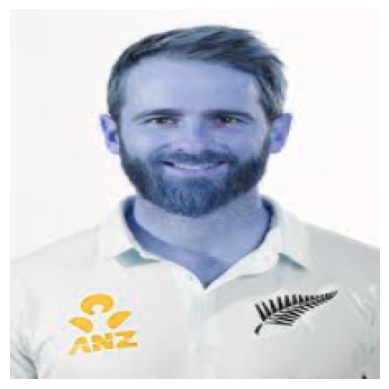

In [87]:
plt.axis('off')
plt.imshow(X[0])

In [88]:
predicted = classifier.predict(np.array([x0_resized, x1_resized, x2_resized]))
predicted = np.argmax(predicted, axis=1)
predicted

1/1 [==============================] - 1s 582ms/step


array([722, 795, 795], dtype=int64)

In [89]:
# Load MobileNetV2 from Keras applications

base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False  # Freeze the base model for transfer learning

In [90]:
# Define the new model with an additional dense layer for classification
num_of_sports_celebrity = 6  # The number of classes (6 celebrities)
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(num_of_sports_celebrity)  # No activation (logits layer)
])

# Display model summary to check the architecture
model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 6)                   │           7,686 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,265,670 (8.64 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [91]:
# Compile the model
model.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

# Train the model (replace X_train_scaled, y_train with your training data)
# Ensure input data is preprocessed with `preprocess_input` from `tf.keras.applications.mobilenet_v2`
X_train_scaled = preprocess_input(X_train)
X_test_scaled = preprocess_input(X_test)

model.fit(X_train_scaled, y_train, epochs=15)

Epoch 1/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 316ms/step - accuracy: 0.2840 - loss: 1.8332
Epoch 2/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 307ms/step - accuracy: 0.5879 - loss: 1.1732
Epoch 3/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 305ms/step - accuracy: 0.7649 - loss: 0.8488
Epoch 4/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 307ms/step - accuracy: 0.8564 - loss: 0.6525
Epoch 5/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - accuracy: 0.8721 - loss: 0.5370
Epoch 6/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 314ms/step - accuracy: 0.9226 - loss: 0.4397
Epoch 7/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 322ms/step - accuracy: 0.9406 - loss: 0.3726
Epoch 8/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 312ms/step - accuracy: 0.9632 - loss: 0.3450
Epoch 9/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 308ms/step - accuracy: 0.9831 - loss: 0.2985
Epoch 10/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 309ms/step - accuracy: 0.9721 - loss: 0.2935
Epoch 11/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 310ms/step - accuracy: 0.9789 - loss: 0.2284
Epoch 12/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 310ms/step

In [92]:
model.evaluate(X_test_scaled,y_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step - accuracy: 0.8259 - loss: 0.6026


[0.5470072627067566, 0.8618420958518982]

In [94]:
y_pred = model.predict(X_test_scaled)
y_pred = [np.argmax(i) for i in y_pred]

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 296ms/step


In [95]:
from sklearn.metrics import confusion_matrix , classification_report
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))

Confusion Matrix:
 [[26  1  3  0  4  0]
 [ 0 23  1  0  0  0]
 [ 2  0 18  0  0  2]
 [ 2  1  1 31  0  0]
 [ 0  0  3  0 24  1]
 [ 0  0  0  0  0  9]]


In [96]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.87      0.76      0.81        34
           1       0.92      0.96      0.94        24
           2       0.69      0.82      0.75        22
           3       1.00      0.89      0.94        35
           4       0.86      0.86      0.86        28
           5       0.75      1.00      0.86         9

    accuracy                           0.86       152
   macro avg       0.85      0.88      0.86       152
weighted avg       0.87      0.86      0.86       152



In [97]:
list_lables = ["Kane Williamson","Kobe Bryant","lionel_messi","Maria Sharapova","ms_dhoni","pardeep_narwal","p_v_sindhu","ronaldo","roger federer","serena_williams","virat_kohli"]

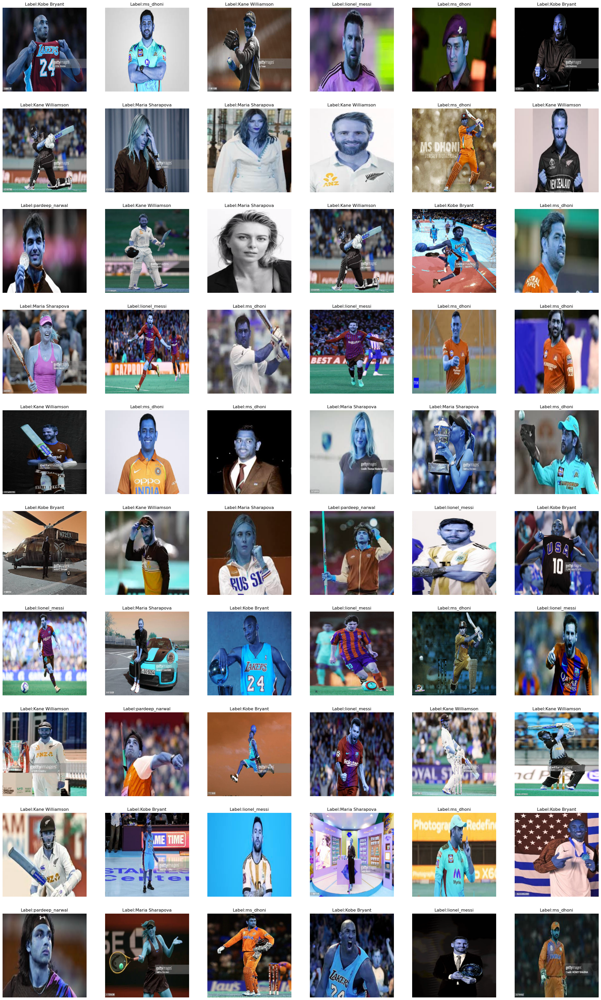

In [98]:
plt.figure(figsize=(30,50))

for i in range(60):
    plt.subplot(10,6,i+1)
    plt.imshow(X_train[i])
    plt.title(f"Label:{list_lables[y_train[i]]}")
    plt.axis("off")

In [ ]:
plt.figure(figsize=(30,40))
for i in range(45):
    plt.subplot(8,6,i+1)
    plt.imshow(X_test[i])
    plt.title(f"Act Label:{list_lables[y_test[i]]}\nPred Label:{list_lables[y_pred[i]]}")
    plt.axis("off")